<h1 align=center><font size = 5> EDA on Air Quality Data (India) from 2015-2020</font></h1>
<br>
<br>
<a><img src = "https://www.deq.ok.gov/wp-content/uploads/air-division/aqi_mini.png" width = 400></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import warnings
warnings.filterwarnings("ignore")
mpl.style.use('ggplot') 
%matplotlib inline

In [2]:
data = pd.read_csv('city_day_new.csv')
data.head(5)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [3]:
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year

In [4]:
data.head(5)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,year
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN,2015
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN,2015
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN,2015
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN,2015
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN,2015


# Report of Air Quality Data in India

In [5]:
report = ProfileReport(data)
report

# How AQI is distributed ?

Text(0.5, 1.0, 'AQI Distibution')

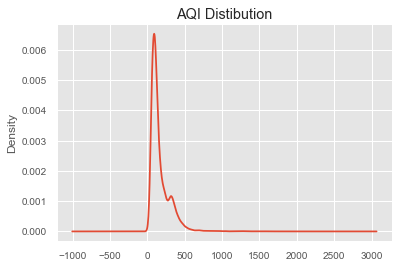

In [6]:
ax = data['AQI'].plot.kde()
ax.set_title('AQI Distibution')

# Which city has highest AQI ?

In [7]:
aqi = pd.DataFrame(data.groupby('City')['AQI'].mean())
aqi = aqi.sort_values('AQI')

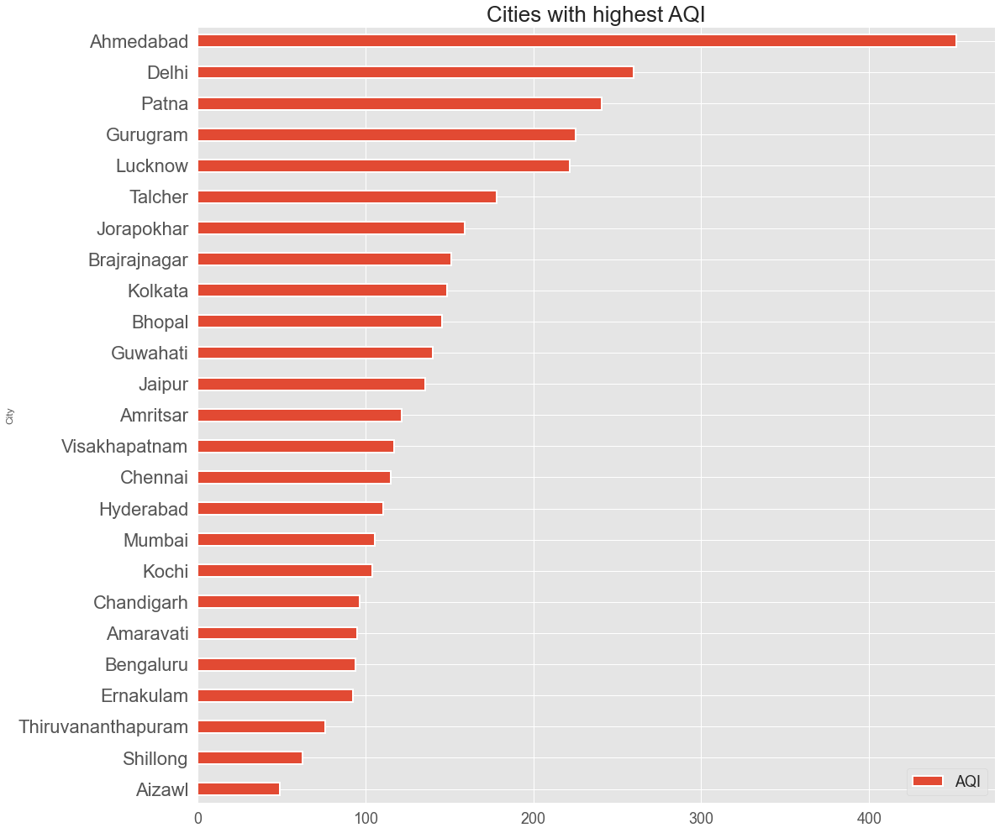

In [8]:
ax = aqi.plot(kind='barh', 
          figsize = (17, 17), 
          width = 0.4,
          linewidth=2, 
          edgecolor='white')

tt = "Cities with highest AQI"
ax.set_title(tt, fontsize=26)
plt.legend(fontsize = 18)
ax.set_yticklabels(aqi.index.tolist(),fontsize=22)
ax.axes.get_yaxis().set_visible(True)
ax.set_xticklabels([0,100,200,300,400],fontsize=18)
ax.axes.get_xaxis().set_visible(True)


# Year Wise AQI of each City

In [9]:
perc = data[['year','City','AQI']]
perc['mean_AQI']=perc.groupby([perc.City,perc.year])['AQI'].transform('mean')
perc.drop('AQI',axis=1,inplace=True)
perc = perc.drop_duplicates().set_index('year')

In [10]:
!jupyter nbextension enable --py --sys-prefix widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [11]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [12]:
@widgets.interact_manual(
    city=aqi.index.tolist())
def plot(city='Ahmedabad',grid=True):
    df = perc[perc['City'] == city]
    df.drop('City',axis=1,inplace=True)
    df.plot(kind='bar', figsize = (10, 5), width = 0.1, linewidth=2, edgecolor='white')
    tt = "Year Wise AQI"
    plt.title(tt, fontsize=18)
    plt.xlabel('Year')
    plt.xticks(rotation=0)
    plt.ylabel('AQI')
    plt.legend(fontsize = 16)

interactive(children=(Dropdown(description='city', index=24, options=('Aizawl', 'Shillong', 'Thiruvananthapura…

# Trend Analysis of AQI for each city

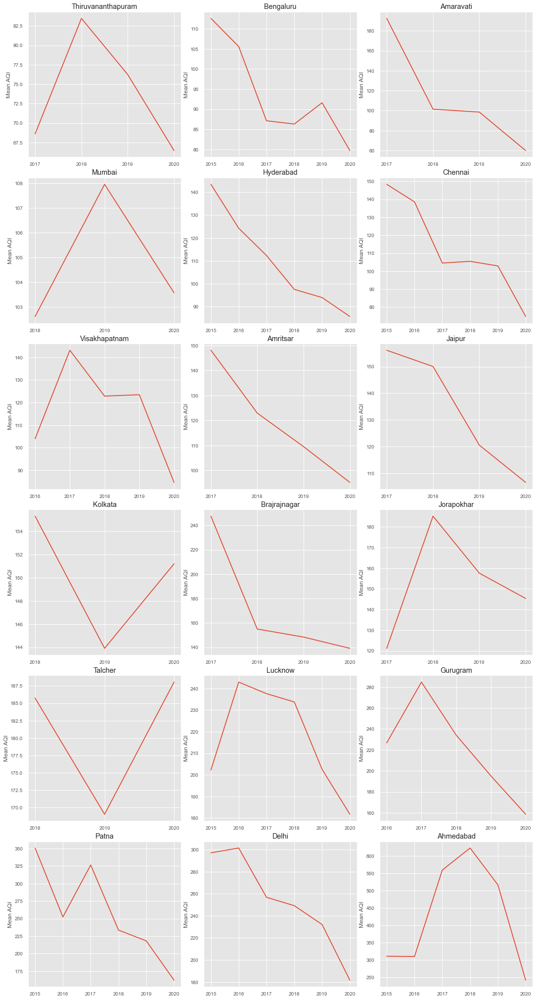

In [13]:
city = aqi.index.tolist()
# Removing cities having data of less than 3 years
unwanted_cities = ['Shillong','Ernakulam','Chandigarh','Kochi','Guwahati','Bhopal','Aizawl'] 
for ele in unwanted_cities:
    city.remove(ele)
fig = plt.figure(figsize=(15,28))
for i in range(len(city)):
    df = data[data['City']==city[i]]
    df_year = df.groupby('year')['AQI'].mean().reset_index().dropna()
    ax = fig.add_subplot(6,3,i+1)
    ax.plot(df_year['year'], df_year['AQI'])
    ax.set_xticks(df_year['year'].tolist())
    ax.set_title(city[i])
    ax.set_ylabel('Mean AQI')
fig.tight_layout(pad=0.5)

<p> ⚠️ Increasing Trend - Kolkata and Talcher</p>
<p> Things aren't looking good for Kolkata and Talcher. All other cities are improving their AQI.</p>

# Variation in Compunds

In [14]:
ele = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene']
df = data.groupby('City')[ele].mean()
# Fill the Null values with 0
df = df.fillna(0.0)

In [15]:
@widgets.interact_manual(
    Compound = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene'])
def plot(Compound='PM2.5',grid=True):
    curr = df[Compound]
    curr.plot(kind='bar', figsize = (20, 10), width = 0.35, linewidth=2, edgecolor='white')
    tt = "Variation in Compounds"
    plt.title(tt, fontsize=18)
    plt.xlabel('City')
    plt.xticks(rotation=45 , ha='right' ,fontsize=17)
    plt.ylabel('Amount')
    plt.legend(fontsize = 18)

interactive(children=(Dropdown(description='Compound', options=('PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'C…

##  Cities which are at higher risks 😷

<p>PM2.5 - Patna, Gurugram, Delhi, Lucknow</p>
<p>PM10 - Delhi , Gurugram, Talcher, Jorapokhar</p>
<p>NO - Kochi, Delhi, Patna, Talcher, Mumbai</p>
<p>NO2 - Ahmedabad, Delhi, Kolkata, Patna, Visakhapatnam</p>
<p>NOx - Kochi, Kolkata, Delhi, Mumbai</p>
<p>NH3 - Chennai</p>
<p>CO - Ahmedabad</p>
<p>SO2 - Ahmedabad, Jorapokhar, Talcher</p>
<p>O3 - Bhopal, Delhi, Jaipur</p>
<p>Benzene - Shilong</p>
<p>Toluene - Shilong</p>
<p>Xylene - Amritsar</p>

Not much information can be extracted from compounds alone. So we will try to visualize the relation between compounds and AQI.

# Relation between Compounds and AQI

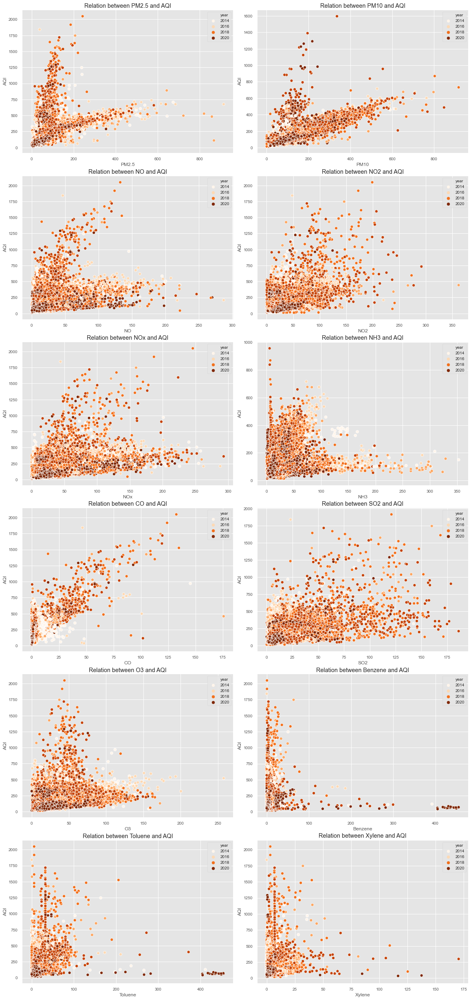

In [16]:
variables = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2','O3', 'Benzene', 'Toluene', 'Xylene']
fig = plt.figure(figsize=(16,34))
for variable,num in zip(variables, range(1,len(variables)+1)):
    ax = fig.add_subplot(6,2,num)
    sns.scatterplot(variable, 'AQI', hue='year', data=data , palette='Oranges')
    plt.title('Relation between {} and AQI'.format(variable))
    plt.xlabel(variable)
    plt.ylabel('AQI')
fig.tight_layout(pad=0.5)

### Check the relation for each compound

<p>Strong Positive Relation - PM2.5, PM10, NOx, CO, O3, NO</p>
<p>Skewed Relation          - NH3, Benzene, Toluene, Xylene</p>
<p>No Relation              - NO2, SO2</p>

# Monthly trend of cities with highest AQI 

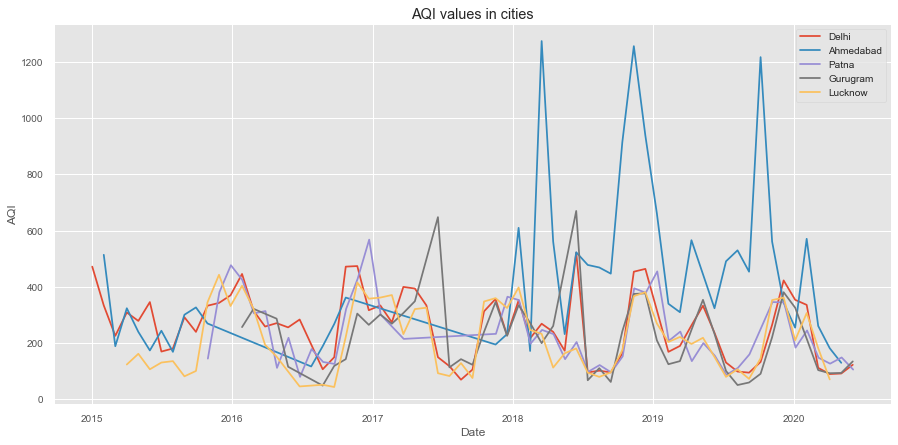

In [17]:
cities = ['Delhi', 'Ahmedabad', 'Patna', 'Gurugram', 'Lucknow']
fig,ax = plt.subplots(figsize=(15, 7))
for city in cities: 
    sns.lineplot(x="Date", y="AQI", data=data[data['City']==city].iloc[::30],label = city)
ax.set_title('AQI values in cities')
ax.legend()

All the cities have almost sililar trend, but except for Ahmedabad city from 2018 onwards there is very high growth in AQI.

<div style=" background-color: #ebecf1;
             padding-top: 40px;
             padding-right: 20px;
             padding-bottom: 40px;
             padding-left: 60px;"><h3>For now this is the end of the analysis. Please do ⭐ the repository if you like it and let me know in the comments if there is anything wrong or how to improve it.</h3></div>